# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Мы проведем исследование рынка Москвы для того чтобы найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Датасет с заведениями общественного питания Москвы составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года

## Шаг 1. Загрузите данные и изучите общую информацию

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings("ignore")

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except: 
    data = pd.read_csv('C:/Users/Илья/Downloads/moscow_places.csv')

In [3]:
def get_info(data):
    data.columns = [x.lower().replace(' ', '_') for x in data.columns] # переименование столбцов по правилам  snake_case
    display(data.head())# первые 5 строка датасета
    display(data.info()) # общая информация
    display(data.describe()) # описание датасета
    display(data.value_counts())
    

In [4]:
get_info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Series([], dtype: int64)

В датасете предоставлена информация о 8406 заведениях по 13 категориям:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  
«Средний счёт: 1000–1500 ₽»;

«Цена чашки капучино: 130–220 ₽»;

«Цена бокала пива: 400–600 ₽».

и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


## Шаг 2. Выполните предобработку данных

Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

Перед тем, как проверять пропуски и дубликаты, изменим регистр на верхний в названиях заведений, а затем проведем проверку на явняе и неявные дубликаты.

In [5]:

data['name'] = data['name'].str.upper()

In [6]:
data.duplicated().sum()

0

Явные дубликаты отсутствуют

In [7]:
data['id']=data['address']+data['name']

data[data['id'].duplicated()==True]['id']

1511     Москва, Волоколамское шоссе, 11, стр. 2MORE POKE
2420    Москва, проспект Мира, 118РАКОВАРНЯ КЛЕШНИ И Х...
3109           Москва, Ярцевская улица, 19ХЛЕБ ДА ВЫПЕЧКА
Name: id, dtype: object

In [8]:
list=['РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ','MORE POKE','ХЛЕБ ДА ВЫПЕЧКА']
data_duplicates=data.query('name in list').sort_values(by='name')
data_duplicates


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id
1430,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,"Москва, Волоколамское шоссе, 11, стр. 2MORE POKE"
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,"Москва, Волоколамское шоссе, 11, стр. 2MORE POKE"
6088,MORE POKE,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN,"Москва, Духовской переулок, 19MORE POKE"
2211,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,"Москва, проспект Мира, 118РАКОВАРНЯ КЛЕШНИ И Х..."
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,"Москва, проспект Мира, 118РАКОВАРНЯ КЛЕШНИ И Х..."
7270,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0,"Москва, Братиславская улица, 12РАКОВАРНЯ КЛЕШН..."
3091,ХЛЕБ ДА ВЫПЕЧКА,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,"Москва, Ярцевская улица, 19ХЛЕБ ДА ВЫПЕЧКА"
3109,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,"Москва, Ярцевская улица, 19ХЛЕБ ДА ВЫПЕЧКА"
7937,ХЛЕБ ДА ВЫПЕЧКА,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN,"Москва, Каширское шоссе, 61ГХЛЕБ ДА ВЫПЕЧКА"


In [9]:
data = data.drop(index=[1430, 2211,3091])

В датасете обнаружено три неявных дубликата - заведения, где совпадают название и адрес .Неявные дубликаты удалены

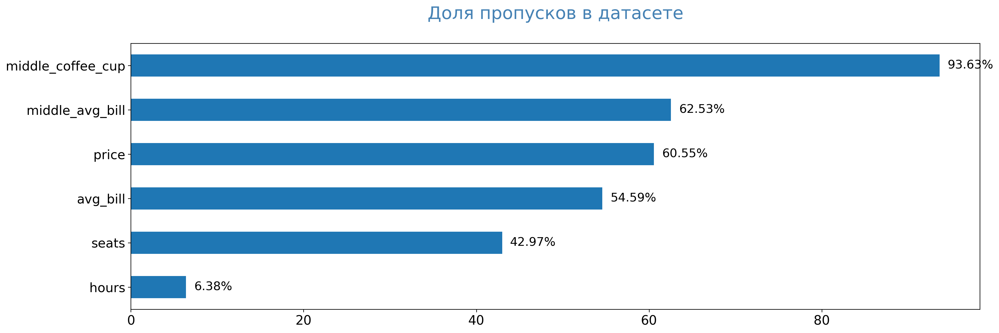

In [10]:
value=((data.isna().mean()*100)
       .to_frame()
       .rename(columns={0:'space'})
       .query('space>0')
       .sort_values(by='space',ascending=True))
ax=value.plot(kind='barh', figsize=(19,6), legend=False, fontsize=16)
ax.set_title('Доля пропусков в датасете'+"\n", fontsize=22, color='SteelBlue')
for i in range(len(value.index)):
    ax.annotate(str(round(value.loc[value.index[i], 'space'], 2))+'%',\
               xy=(value.loc[value.index[i],'space'],i),xytext=(10,0), textcoords='offset points',\
               ha='left', va='center', fontsize=15)

В датасете допущены пропуски в столбцах средний чек, средняя цена капучино, категория цен заведения,  средняя стоимость заказа, количество мест, часы работы.
Во всех столбцах, кроме часов работы, пропуски допущены в 40-90 % данных, и заполнить такие пропуски невозможно.

Создайте столбец street с названиями улиц из столбца с адресом.

In [11]:
data['street']=data['address'].str.split(',').str[1]
data['street'] = data['street'].str.upper()

In [12]:
data['street'] = data['street'].str.strip()

In [13]:
#Код ревьюера
data.query('street == "ПРОСПЕКТ МИРА"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street
718,ВСЕ ЛЕНЬ,ресторан,"Москва, проспект Мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,"Москва, проспект Мира, 119, стр. 528ВСЕ ЛЕНЬ",ПРОСПЕКТ МИРА
786,СТАРОЕ МЕСТО,кафе,"Москва, проспект Мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,"Москва, проспект Мира, 119, стр. 504СТАРОЕ МЕСТО",ПРОСПЕКТ МИРА
792,DONER ONE,кафе,"Москва, проспект Мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,"Москва, проспект Мира, 119, стр. 596DONER ONE",ПРОСПЕКТ МИРА
800,ПЯН-СЕ,быстрое питание,"Москва, проспект Мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,"Москва, проспект Мира, 119, стр. 27ПЯН-СЕ",ПРОСПЕКТ МИРА
909,КОСМОС,кафе,"Москва, проспект Мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,"Москва, проспект Мира, 119, стр. 34КОСМОС",ПРОСПЕКТ МИРА
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,ICE EMBASSY,кафе,"Москва, проспект Мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,0,273.0,"Москва, проспект Мира, 26, стр. 2ICE EMBASSY",ПРОСПЕКТ МИРА
2571,"ХАЛВА, СЕТЬ ПОЧТОМАТОВ",кафе,"Москва, проспект Мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0,"Москва, проспект Мира, 146ХАЛВА, СЕТЬ ПОЧТОМАТОВ",ПРОСПЕКТ МИРА
2572,РЕСТОРАН,ресторан,"Москва, проспект Мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,0,200.0,"Москва, проспект Мира, 62, стр. 1РЕСТОРАН",ПРОСПЕКТ МИРА
4782,FOOD EMBASSY,ресторан,"Москва, проспект Мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,"Москва, проспект Мира, 26, стр. 2FOOD EMBASSY",ПРОСПЕКТ МИРА


Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  
логическое значение True — если заведение работает ежедневно и круглосуточно;

логическое значение False — в противоположном случае.

In [14]:
data['is_24/7'] = np.where(data['hours']=='ежедневно, круглосуточно',True, False)

## Шаг 3. Анализ данных

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [15]:
muted = sns.color_palette("bright", 10)

colors = {'кафе': muted[0], 
          'ресторан': muted[1], 
          'кофейня': muted[2], 
          'пиццерия': muted[3], 
          'бар,паб': muted[4],
          'быстрое питание': muted[5],
          'булочная': muted[6],
          'столовая':muted[7]
         }
colors_2 = {'Северный административный округ': muted[0], 
          'Северо-Восточный административный округ': muted[1],
          'Северо-Западный административный округ': muted[2], 
          'Западный административный округ': muted[3], 
          'Центральный административный округ': muted[4],
          'Восточный административный округ': muted[5],
          'Юго-Восточный административный округ': muted[6],
          'Южный административный округ':muted[7],
          'Юго-Западный административный округ':muted[8]  
            
         }

In [16]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

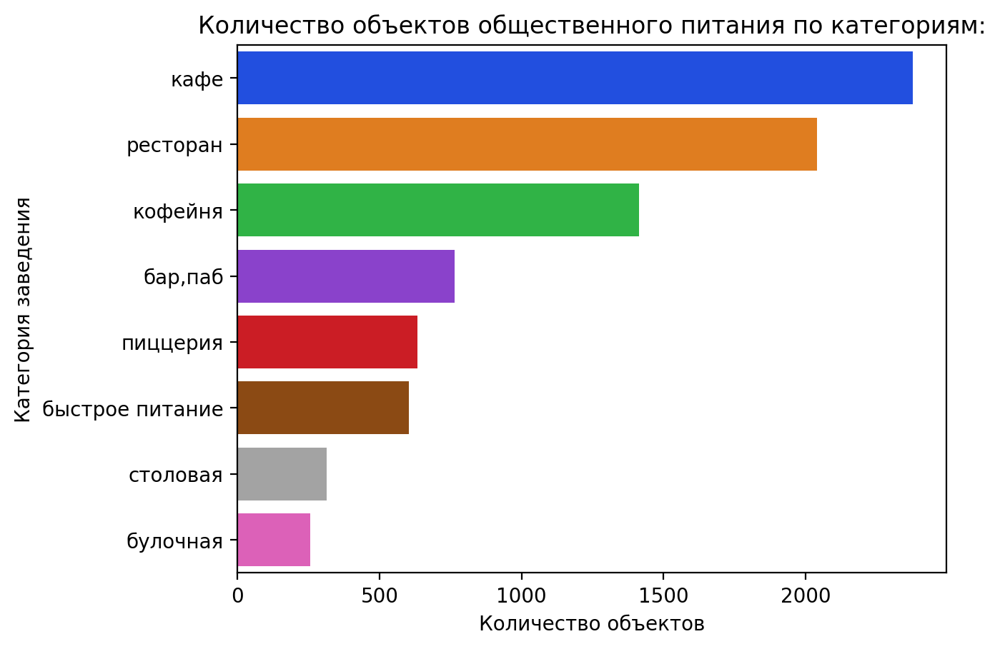

In [17]:
sns.countplot(y=data["category"],order=data["category"].value_counts().index, palette=colors)
plt.title('Количество объектов общественного питания по категориям:', fontsize=12)
plt.xlabel('Количество объектов')
plt.ylabel('Категория заведения');

Лидеры по количеству объектов питания - кафе, рестораны и кофейни, на втором месте бары, пабы, пиццерии и быстрое питание, самые малочисленные - столовые и булочные.

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

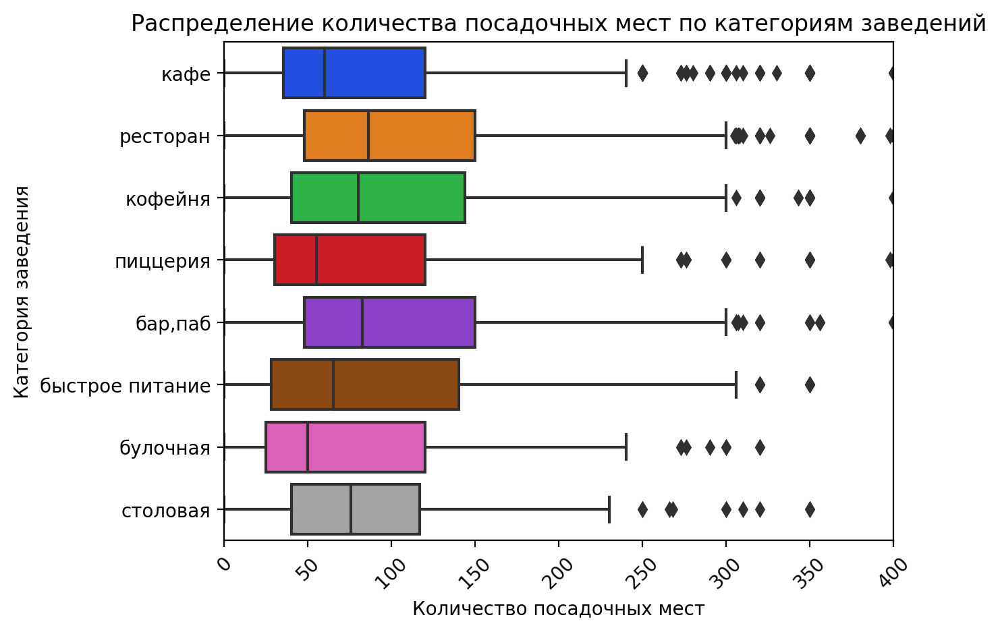

In [18]:
ax = sns.boxplot(y='category', x='seats', data=data, palette=colors)
plt.xticks(rotation=45)
plt.xlim([0, 400])
plt.title('Распределение количества посадочных мест по категориям заведений', fontsize=12)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения');



Самое большое среднее количество мест ожидаемо в заведениях быстрого питания, ресторанах, кофейнях и пабах, в среднем это 80-90 мест. В кафе, пиццериях и булочных и столовых в среднем мест меньше -  50-60. 

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.


In [19]:
chains=data.pivot_table(index='chain', values='name',  aggfunc='count', margins=True)
chains['share']=round(chains['name']/data['name'].count()*100)
chains

,name,share
chain,,
0,5199,62.0
1,3204,38.0
All,8403,100.0


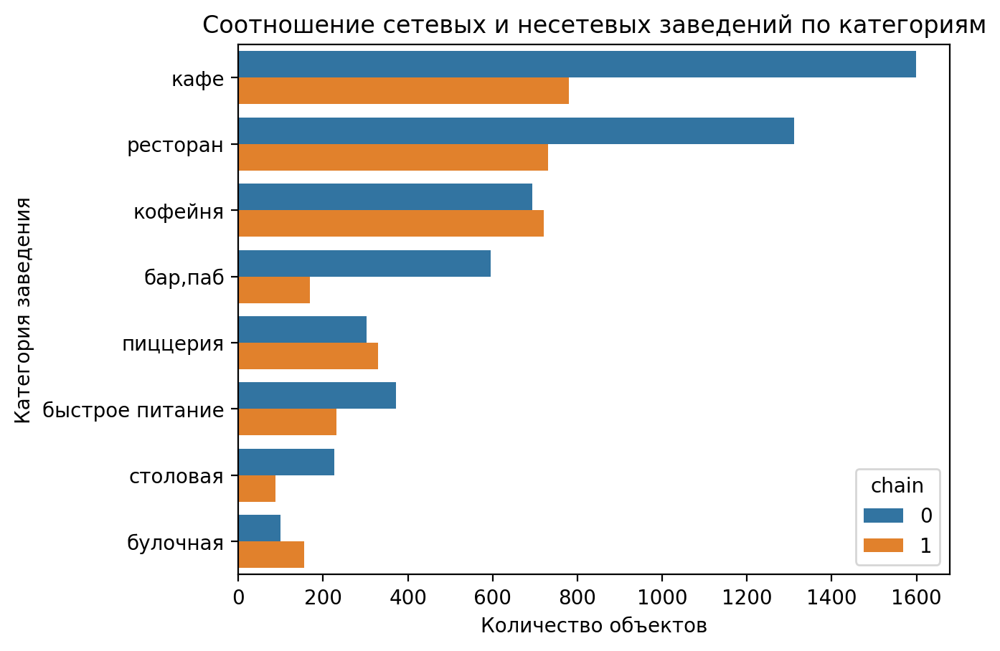

In [20]:
sns.countplot(data=data, y="category", hue='chain', order=data["category"].value_counts().index)
plt.title('Cоотношение сетевых и несетевых заведений по категориям', fontsize=12)

plt.xlabel('Количество объектов')
plt.ylabel('Категория заведения');


В Москве преобладают несетевые заведения, их 62% от общего количества, их  собенно много в таких категориях как кафе, рестораны, бары и пабы - здесь количество несетевых заведений в два-три раза больше, чем сетевых. Категории, где количество сетевых и несетевых заведений почти совпадает - это кофейни и пиццерии, и только в категории булочных заметно больше сетевых заведений.

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [21]:
# отфильтруем данные, сгруппируем по городам и посчитаем объявления
data_chain=data.query('chain==1')
data_chain_top= data_chain.groupby('name')[['name']].count()
# переименуем столбец
data_chain_top.columns = ['total_count']
# отсортируем и оставим пять лидеров
data_chain_top = data_chain_top.reset_index().sort_values(by='total_count', ascending=False).head(15)
list=data_chain_top['name'].tolist ()


In [22]:
data_top_list=data_chain.query('name in list')
data_chain_pivot = data_top_list.pivot_table(index='name', columns='category',values='address', aggfunc='count', margins=True).sort_values('All', ascending=True).drop('All', axis=1).drop('All')


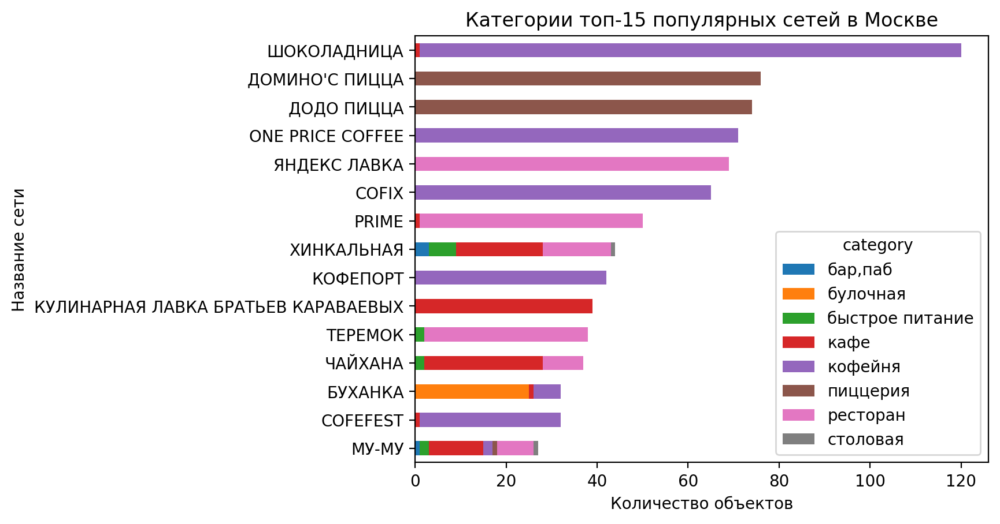

In [23]:
data_chain_pivot.plot(kind='barh', stacked=True)
plt.title('Категории топ-15 популярных сетей в Москве', fontsize=12)
plt.xlabel('Количество объектов')
plt.ylabel('Название сети');
plt.show();

In [24]:
import pandas as pd
import plotly.express as px

fig = px.scatter(data_top_list,             # загружаем данные
                 x='seats', # указываем столбец с данными для оси X
                 y="middle_avg_bill",  # указываем столбец с данными для оси Y
                 color='name') # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей в Москве:зависимость среднего счета от количества мест',
                   xaxis_title='Количество мест',
                   yaxis_title='Средний счет')

fig.show() # выводим график

Среди топ-15 популярных сетей Москвы больше всего кофеен, ресторанов,  пиццерии и кафе. Пятёрка лидеров - Шоколадница, Домино'с пицца, Додо пицца, One Price Coffe и Яндекс Лавка, в каждой из этих сетей больше 60 ресторанов.
В сетевых заведениях среднее количество мест менее 200 и средний счёт до 500 рублей.


In [25]:
def percentage(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

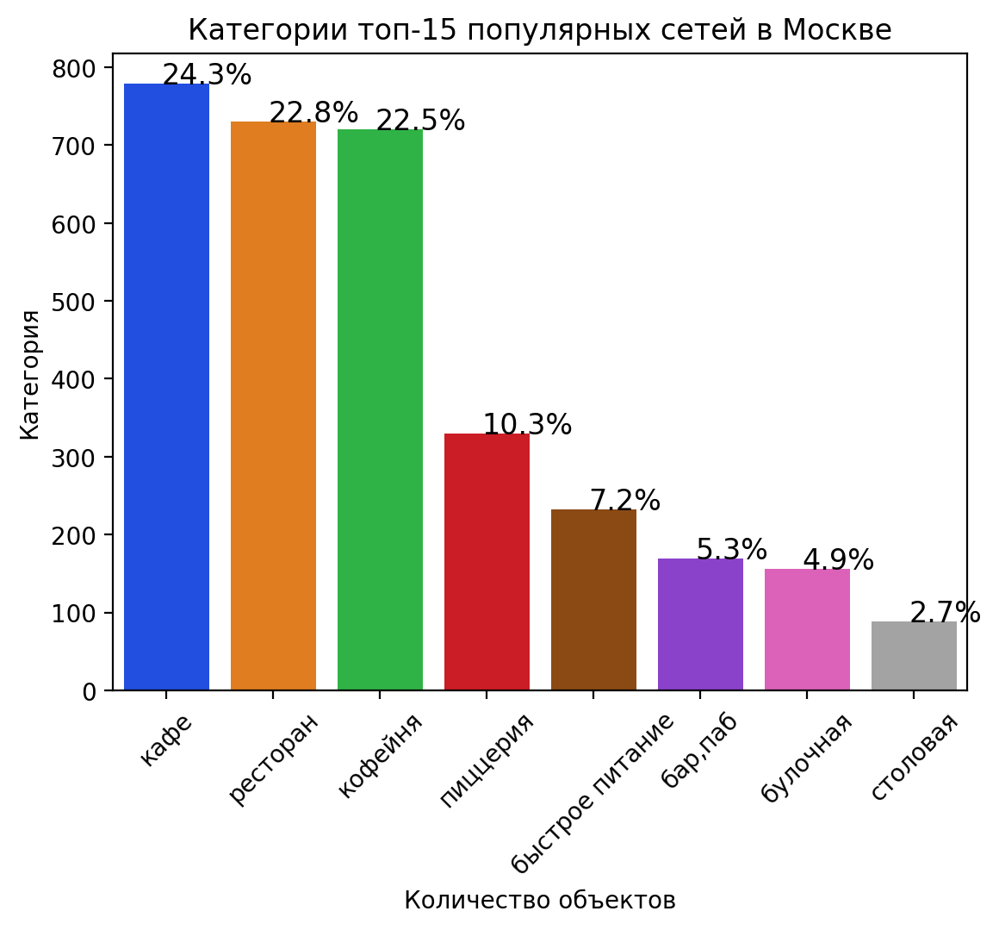

In [26]:
ax=sns.countplot(x=data_chain["category"], order=data_chain["category"].value_counts().index, orient='h',palette=colors)
plt.title('Категории топ-15 популярных сетей в Москве', fontsize=12)
plt.xlabel('Количество объектов')
plt.ylabel('Категория')
percentage(ax, data_chain.category)
plt.xticks(rotation=45);

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [27]:
n=data['district'].nunique()
u=data['district'].unique().tolist()
f'В датасете представлено  {n} административных районов Москвы,  это:{u}'

"В датасете представлено  9 административных районов Москвы,  это:['Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ']"

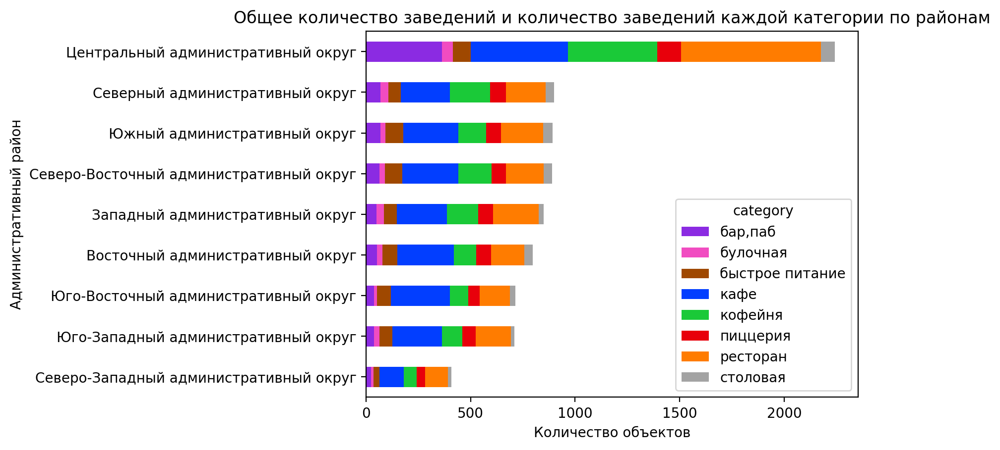

In [28]:
district_category=data.pivot_table(index='district', values='name', columns='category', aggfunc='count', margins=True)\
.sort_values('All', ascending=True).drop('All', axis=1).drop('All')

district_category.plot(kind='barh', stacked=True,color=colors, title='Общее количество заведений и количество заведений каждой категории по районам')
plt.xlabel('Количество объектов')
plt.ylabel('Административный район');

Самое большое количество заведений находится в Центральном административном округе Москвы, этот район район с отрывом от остальных более чем в два раза, дальше очень близко к друг другу идут Серверный, Южный, Северо-восточный административные округа.

Самая многочисленная категория для всех районов - рестораны и кафе, в Центральном административном округе так же очень популярны кофейни.

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

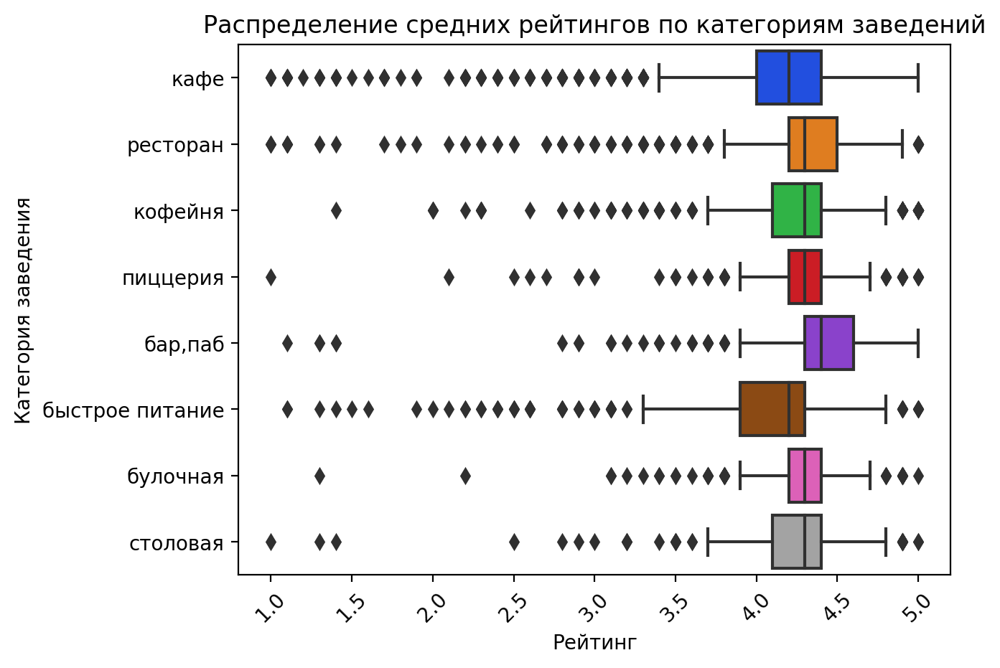

In [29]:
ax = sns.boxplot(y='category', x='rating', data=data, palette=colors)
plt.xticks(rotation=45)
plt.title('Распределение средних рейтингов по категориям заведений', fontsize=12)
plt.xlabel('Рейтинг')
plt.ylabel('Категория заведения');

Средний рейтинг для всех категорий составляет 4,0-4,5 балла, при этом  во всех категориях есть достаточно большое количество выбросов.  самый большой размах колебаний в рейтинге у кафе и заведений быстрого питания,  а самый высокий средний рейтинг у баров и пабов.

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

Для каждого округа посчитаем медианный рейтинг торговых центров, которые находятся на его территории:

In [30]:
rating_df = data.groupby(by=['district'], as_index=False)['rating'].agg('median')


In [31]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

FileNotFoundError: [Errno 2] No such file or directory: '/datasets/admin_level_geomap.geojson'

In [32]:
!pip install folium

  Using cached folium-0.14.0-py2.py3-none-any.whl (102 kB)
  Using cached branca-0.6.0-py3-none-any.whl (24 kB)


In [33]:
# импортируем карту и хороплет

from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
    as_index=False).add_to(m)

# выводим карту
m

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [34]:
from folium.plugins import MarkerCluster
from folium import Map, Marker
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)


In [35]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Самый высокий рейтинг у заведений в Центральном административном окуруге

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [36]:
data_top_streets=data['street'].value_counts().head(15).reset_index()
list=data_top_streets['index'].tolist()
data_top_s=data.query('street in list')


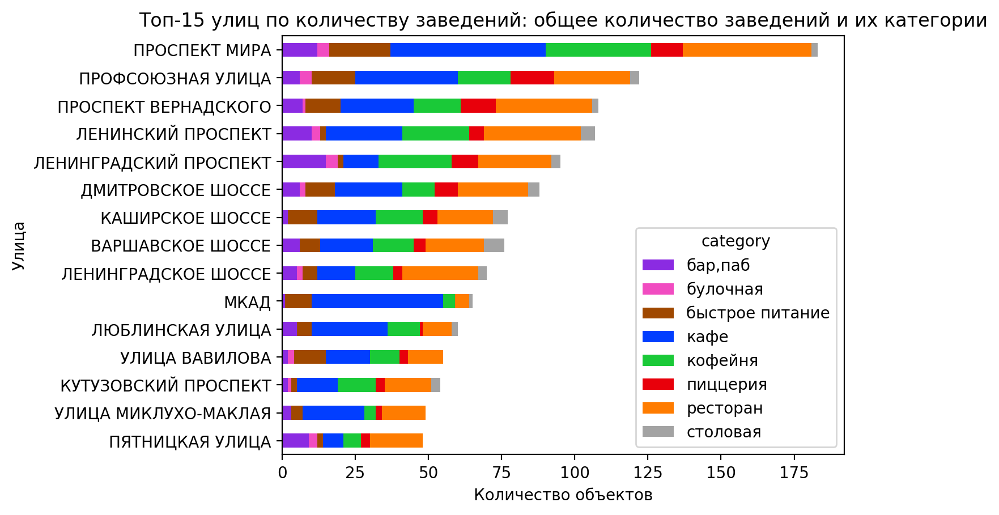

In [37]:
street_category=data_top_s.pivot_table(index='street', values='name', columns='category', aggfunc='count', margins=True)\
.sort_values('All', ascending=True).drop('All', axis=1).drop('All')
street_category.plot(kind='barh', stacked=True,color=colors, title='Топ-15 улиц по количеству заведений: общее количество заведений и их категории')
plt.xlabel('Количество объектов')
plt.ylabel('Улица');

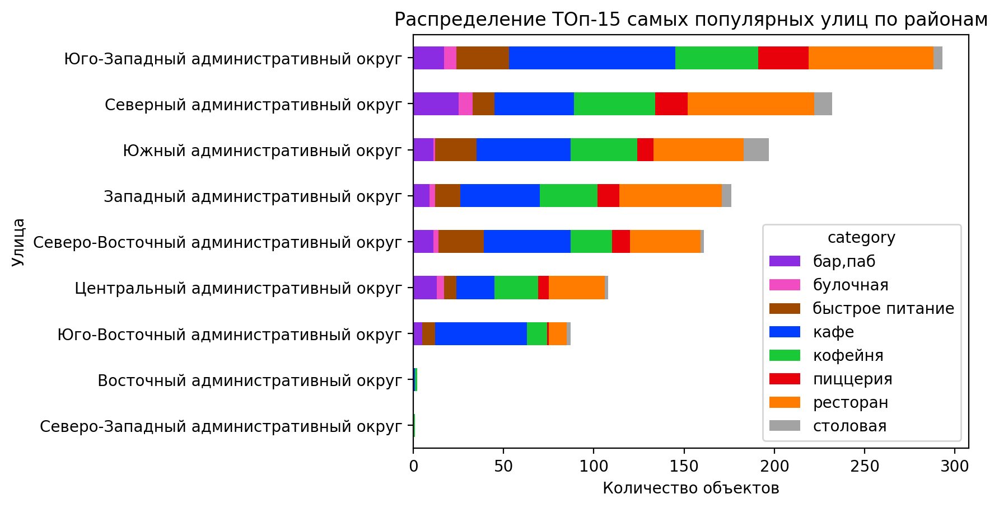

In [38]:
district_category=data_top_s.pivot_table(index='district', values='name', columns='category', aggfunc='count', margins=True)\
.sort_values('All', ascending=True).drop('All', axis=1).drop('All')
district_category.plot(kind='barh', stacked=True,color=colors, title='Распределение ТОп-15 самых популярных улиц по районам')
plt.xlabel('Количество объектов')
plt.ylabel('Улица');

Топ-15 улиц по количеству заведений находятся в разных районах, больше всего в Юго-Западном и Северном административных округах. 
Что интересно в Центральном административном округе, лидере по общему числу заведений, таких улиц немного. 

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [39]:
data_streets_1=data['street'].value_counts().reset_index()
data_streets_1=data_streets_1.query('street ==1')
n=data_streets_1['street'].count()
f'В датасете представлено  {n} улиц с одним объектом общепита'


'В датасете представлено  457 улиц с одним объектом общепита'

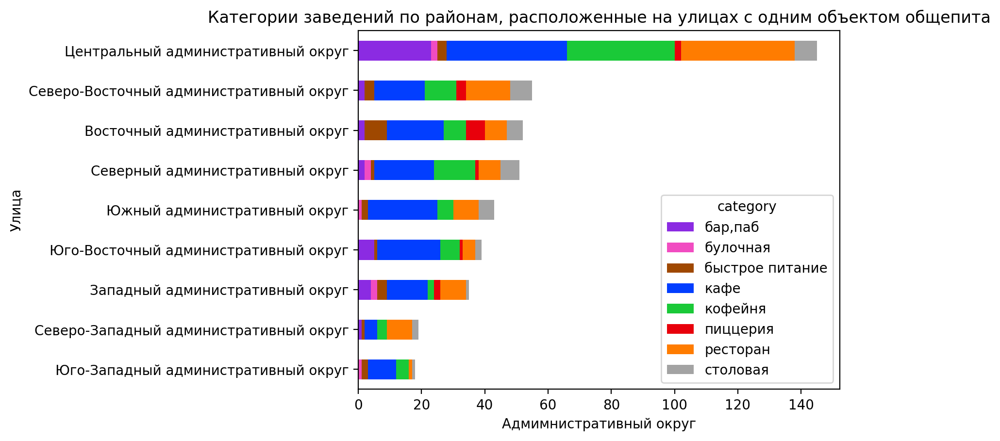

In [40]:
list=data_streets_1['index'].tolist()
data_1=data.query('street in list')

street_category=data_1.pivot_table(index='district', values='name', columns='category', aggfunc='count', margins=True)\
.sort_values('All', ascending=True).drop('All', axis=1).drop('All')
street_category.plot(kind='barh', stacked=True,color=colors, title='Категории заведений по районам, расположенные на улицах с одним объектом общепита')
plt.xlabel('Адмимнистративный округ')
plt.ylabel('Улица');


Как и при анализе всех заведений, в списке райлонов, где есть улицы только с одним объектом общепита на первом месте идет Центральный административный округ Москвы, и снова с большим отрывом. Далее  идут Серверный, Южный, Северо-восточный административные округа.
По категориям лидеры так же не помнялись - это рестораны, кафе и кофейни.


Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [41]:
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
district_avg_bill=data.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг средних чеков заведений по районам',
).add_to(m_2)

# выводим карту
m_2

- Если смотреть в целом на количество заведений,  самый популярный формат в Москве - кафе, рестораны и кофейни, а середине списка - пиццерии, бары и быстрое питание, а самые малочисленные - столовые и булочные.
- Самое большое среднее количество мест ожидаемо в заведениях быстрого питания, ресторанах, кофейнях и пабах, в среднем это 80-90 мест. В кафе, пиццериях и булочных и столовых в среднем мест меньше -  50-60.
- В Москве преобладают несетевые заведения, особенно в таких категориях как кафе, рестораны, бары и пабы - здесь количество несетевых заведений в два-три раза больше, чем сетевых. Категории, где количество сетевых и несетевых заведений почти совпадает - это кофейни и пиццерии, и только в категории булочных заметно больше сетевых заведений.
- Типичное сетевое заведение в Москве - это кофейня, ресторан, пиццерии или кафе, со средним счётом до 500 рублей и количеством посадочных мест до 200
- Самое большое количество заведений находится в Центральном, Северном и Южном административных округах, причём Центральный округ лидирует с большим отрывом.
- Самые популярные улицы по количеству заведений - проспект Мира, Профсоюзная улица и проспект Вернадского, вместе с тем нельзя сказать что самые популярные улица находятся в Центральном округе - тут он уступает Юго-Западному административному округу.  
- москвичи изредка  могут ставить крайне низкие оценки заведениям  но средний рейтинг для всех категорий составляет 4,0-4,5 балла. Самый большой размах колебаний в рейтинге у кафе и заведений быстрого питания, а самый высокий средний рейтинг у баров и пабов.

##  Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения? Есть ли круглосуточные кофейни?

In [42]:
coffee_house_data=data.query('category == "кофейня"').reset_index()
n=coffee_house_data['name'].count()
n_24_7=coffee_house_data['is_24/7'].values.sum()

f'В датасете представлено  {n} кофеен, из них работающих круглосуточно {n_24_7}, что составляет {round(n_24_7/n*100)} % от их общего числа'

'В датасете представлено  1413 кофеен, из них работающих круглосуточно 59, что составляет 4 % от их общего числа'

Какие у кофеен рейтинги? Как они распределяются по районам?

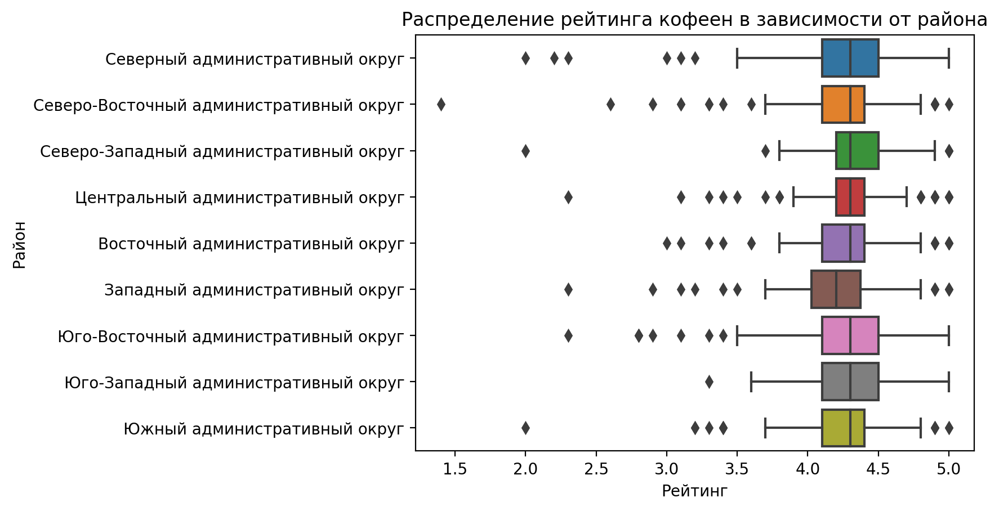

In [43]:
ax = sns.boxplot(y='district', x='rating', data=coffee_house_data)
#plt.xticks(rotation=45)
#plt.xlim([0, 400])
plt.title('Распределение рейтинга кофеен в зависимости от района', fontsize=12)
plt.xlabel('Рейтинг')
plt.ylabel('Район');

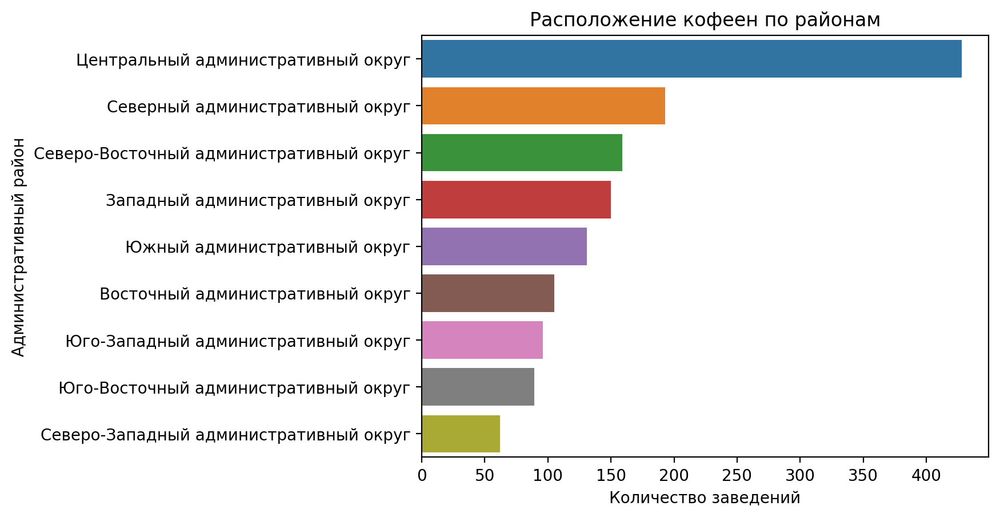

In [44]:
sns.countplot(y=coffee_house_data["district"], order=coffee_house_data["district"].value_counts().index)
plt.title('Расположение кофеен по районам', fontsize=12)
plt.xlabel('Количество заведений')
plt.ylabel('Административный район');

Больше всего кофеен в Центральном административном округе, самом многочисленном по заведениям всех категорий. 

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

В датасете пропущено более 90% информации в столбце стоимости чашки капучино, как альтернативу проанализируем взаимосвязь среднего счета и количества посадочных мест. 

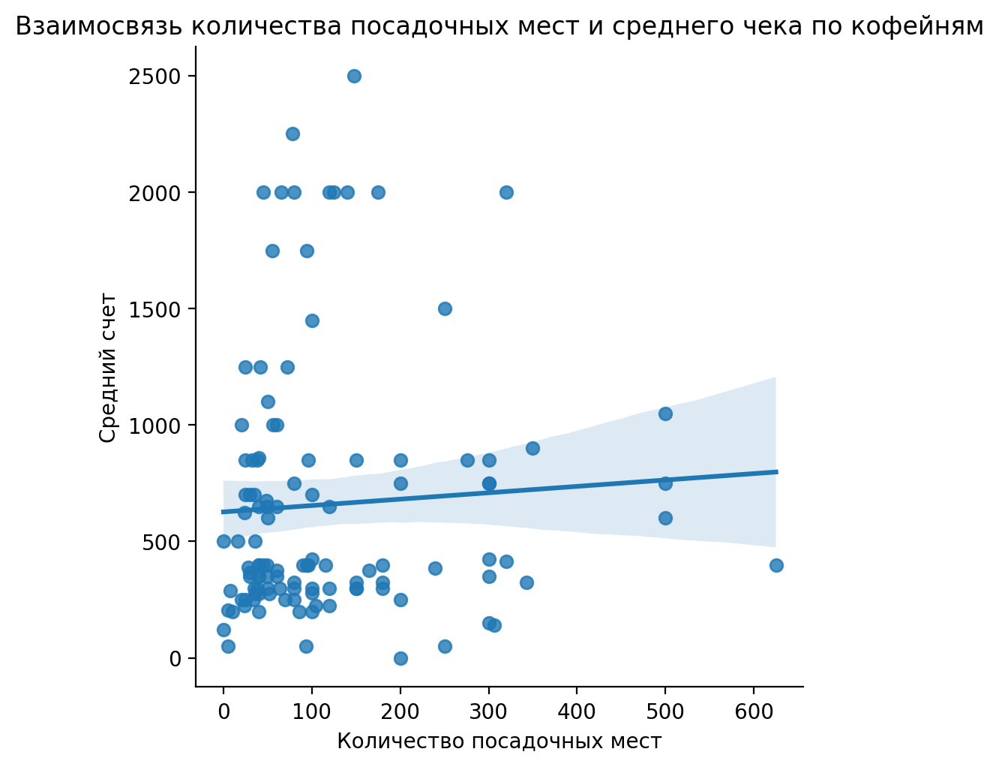

In [45]:
sns.lmplot(data=coffee_house_data, y='middle_avg_bill', x='seats')
plt.title('Взаимосвязь количества посадочных мест и среднего чека по кофейням', fontsize=12)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Средний счет');

Средний счет существенно не растет с увеличением количества посадочных мест и колеблется у цифры 600 рублей.  Если предполагать что эта сумма включает стоимости чашки каппучино и торт/второе блюдо, то для чашки капучино можно выбрать стоимость 150-250 рублей.


In [46]:
coffee_house_data['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

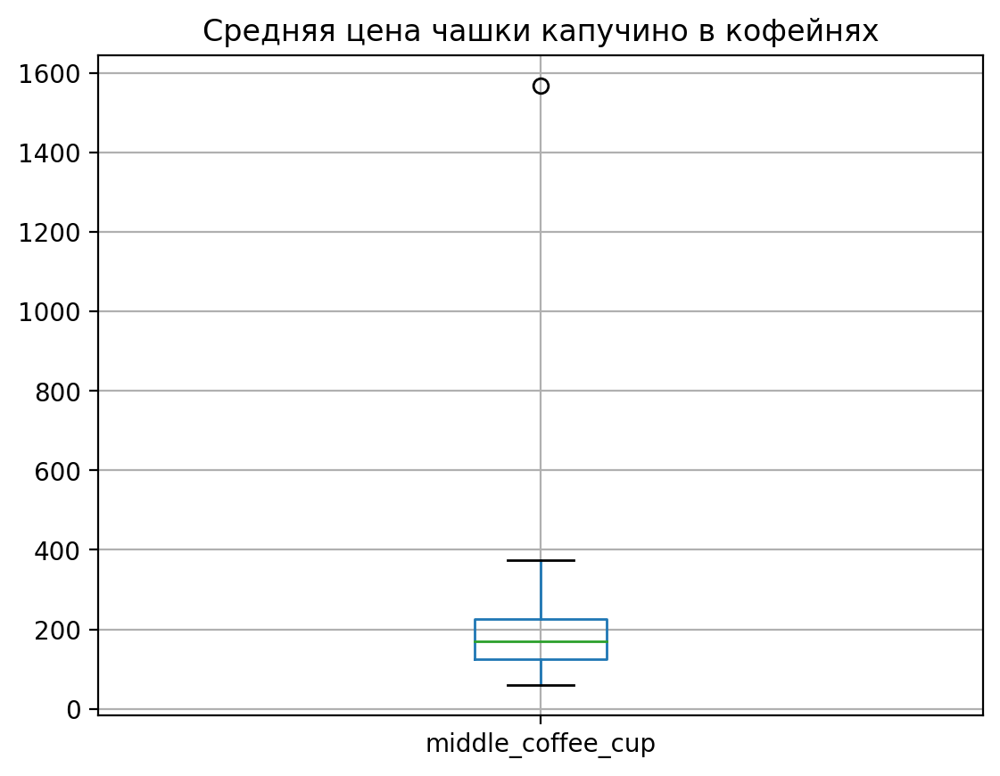

In [47]:
coffee_house_data.boxplot('middle_coffee_cup')
plt.title('Средняя цена чашки капучино в кофейнях', fontsize=12);


В столбце средней стоимости чашки капучино  всего один выброс где стоимость превышает 400 рублей, рассмотрим его подробнее. 

In [48]:
data_temp=coffee_house_data.query('middle_coffee_cup>400')
data_temp

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24/7
535,2859,ШОКОЛАДНИЦА,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,"Москва, Большая Семёновская улица, 27, корп. 1...",БОЛЬШАЯ СЕМЁНОВСКАЯ УЛИЦА,False


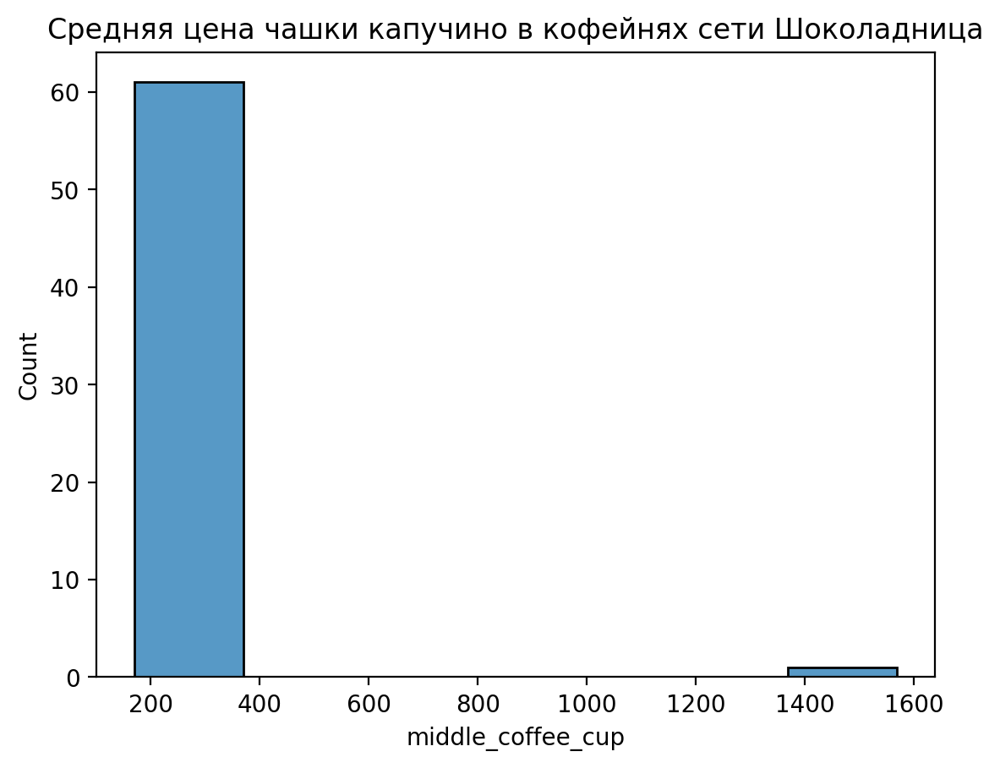

In [49]:
data_choco=coffee_house_data.query('name=="ШОКОЛАДНИЦА"')
sns.histplot(data_choco, x='middle_coffee_cup')
plt.title('Средняя цена чашки капучино в кофейнях сети Шоколадница', fontsize=12);


 Выброс относится к кофейне сети Шоколадница на Большой Семёновской улице. Если для все остальной сети средняя стоимость чашки составляет 160-370 рублей,  то в этом заведений она равна 1568 рублей.
 Если предположить, что в столбце среднего счета допущена опечатка, то правильная цена одной чашки капучино должна быть:
 (230+290)/2=260 рублей. Заменим значение на верное и проврим еще раз реднюю цену чашки капучино в кофейнях.
 

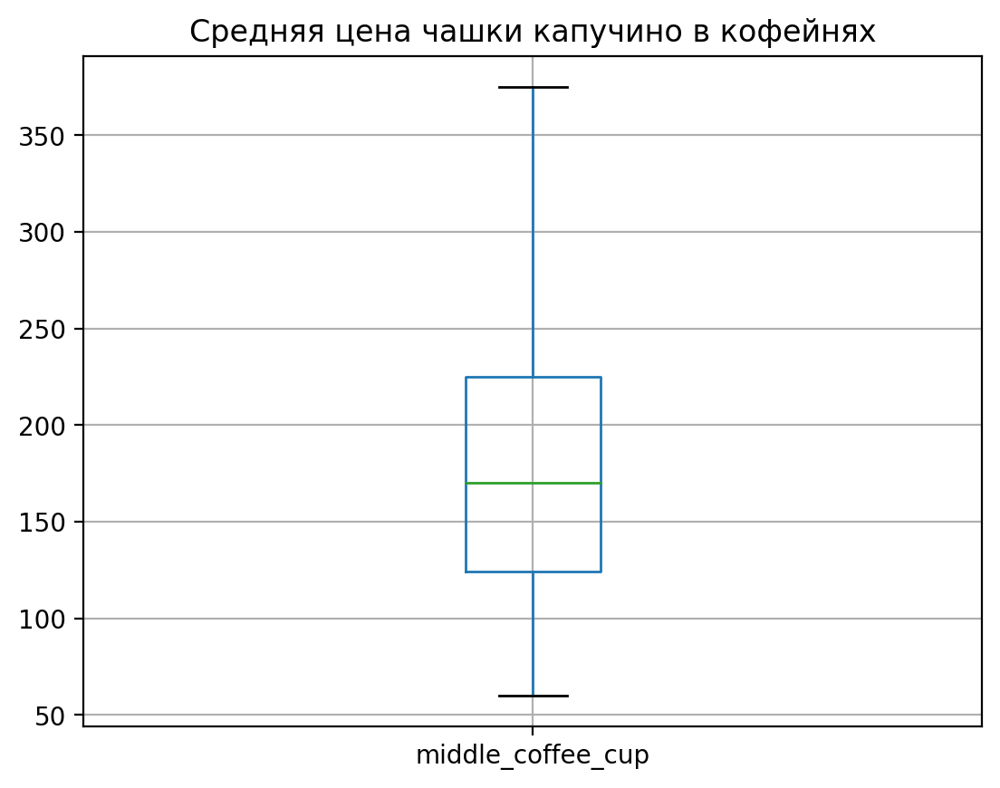

In [50]:
data.loc[(data.middle_coffee_cup > 400), ('middle_coffee_cup')] = 260
coffee_house_data=data.query('category == "кофейня"').reset_index()
coffee_house_data.boxplot('middle_coffee_cup')
plt.title('Средняя цена чашки капучино в кофейнях', fontsize=12);


Средняя стоимость чашки капучино в кофейнях составляет 170 рублей и колеблется в пределах  125-220 рублей.

Проведем проверку по датасету на названия, ассоциирующиеся с сериалом Друзья

In [51]:
search=['CENTRAL', 'PERK', 'FRIENDS', 'ФРЕНДС']
items=data['name'].tolist ()
list=[]
for i in items: 
    for s in search: 
        if s in i:
            list.append(i)
data_friends=data.query('name in list').reset_index()
data_friends

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24/7
0,2187,FRIENDS FOREVER BOTANICA,кафе,"Москва, проспект Мира, 26, стр. 1",Центральный административный округ,"ежедневно, 08:00–23:00",55.778032,37.633068,4.6,NaN,NaN,NaN,NaN,0,200.0,"Москва, проспект Мира, 26, стр. 1FRIENDS FOREV...",ПРОСПЕКТ МИРА,False
1,2669,ФРЕНДС,"бар,паб","Москва, Краснобогатырская улица, 90, стр. 2",Восточный административный округ,"ежедневно, 08:00–23:00",55.801229,37.710160,4.5,средние,Средний счёт:400–700 ₽,550.0,NaN,0,52.0,"Москва, Краснобогатырская улица, 90, стр. 2ФРЕНДС",КРАСНОБОГАТЫРСКАЯ УЛИЦА,False
2,3008,FRIENDS & FAMILY,пиццерия,"Москва, Осенний бульвар, 7, корп. 2",Западный административный округ,"ежедневно, 11:30–00:30",55.757661,37.405807,4.5,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,80.0,"Москва, Осенний бульвар, 7, корп. 2FRIENDS & F...",ОСЕННИЙ БУЛЬВАР,False
3,3019,4FRIENDS COFFEE,кафе,"Москва, Осенний бульвар, 10, корп. 1",Западный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–21:00",55.756903,37.409002,4.6,средние,Средний счёт:150–250 ₽,200.0,NaN,0,300.0,"Москва, Осенний бульвар, 10, корп. 14FRIENDS C...",ОСЕННИЙ БУЛЬВАР,False
4,3459,FRIENDS FOREVER,кафе,"Москва, Малая Никитская улица, 2/1с1",Центральный административный округ,"ежедневно, 08:00–23:00",55.757936,37.596914,4.6,NaN,NaN,NaN,NaN,0,NaN,"Москва, Малая Никитская улица, 2/1с1FRIENDS FO...",МАЛАЯ НИКИТСКАЯ УЛИЦА,False
5,3566,MR. HELP & FRIENDS,"бар,паб","Москва, 1-я Тверская-Ямская улица, 27",Центральный административный округ,пн-чт 15:00–00:00; пт 15:00–06:00; сб 16:00–06...,55.775747,37.585802,4.6,выше среднего,Цена бокала пива:390 ₽,NaN,NaN,0,94.0,"Москва, 1-я Тверская-Ямская улица, 27MR. HELP ...",1-Я ТВЕРСКАЯ-ЯМСКАЯ УЛИЦА,False
6,3966,БЕЗ РЕЦЕПТА IN FRIENDS SOCIAL CLUB,кафе,"Москва, Кутузовский проспект, 1/7",Западный административный округ,пн-чт 08:00–22:00; пт 08:00–23:00; сб 10:00–23...,55.749984,37.571512,4.4,NaN,NaN,NaN,NaN,0,NaN,"Москва, Кутузовский проспект, 1/7БЕЗ РЕЦЕПТА I...",КУТУЗОВСКИЙ ПРОСПЕКТ,False
7,4001,FRIENDS SOCIAL CLUB,кафе,"Москва, Кутузовский проспект, 1/7",Западный административный округ,пн-чт 08:00–22:00; пт 08:00–23:00; сб 10:00–23...,55.749973,37.571478,4.4,NaN,NaN,NaN,NaN,0,NaN,"Москва, Кутузовский проспект, 1/7FRIENDS SOCIA...",КУТУЗОВСКИЙ ПРОСПЕКТ,False
8,4289,CITY FRIENDS,ресторан,"Москва, Пресненская набережная, 8, стр. 1",Центральный административный округ,"ежедневно, 09:00–21:00",55.747235,37.538713,4.3,NaN,NaN,NaN,NaN,0,478.0,"Москва, Пресненская набережная, 8, стр. 1CITY ...",ПРЕСНЕНСКАЯ НАБЕРЕЖНАЯ,False
9,4349,ФРЕНДС В ГОСТЯХ У МОНИКИ,"бар,паб","Москва, улица Покровка, 20/1с1",Центральный административный округ,"ежедневно, 09:00–00:00",55.758204,37.647272,4.6,средние,Средний счёт:700–1200 ₽,950.0,NaN,0,NaN,"Москва, улица Покровка, 20/1с1ФРЕНДС В ГОСТЯХ ...",УЛИЦА ПОКРОВКА,False


В датасете есть 14 заведений так или иначе содержащих в названии ключевые слова, и после проверки заведений в  интернете было выявлено, 
что уже существуют  бар,паб "ФРЕНДС" и "ФРЕНДС В ГОСТЯХ У МОНИКИ" - сетевые заведения в Москве и Санкт-Петербурге (https://friendsmsk.ru/, https://friendsspb.ru/),  которые используют концепцию кофейни «Central Perk» из сериала Друзья.

Открыть кофейню в духе «Central Perk» из сериала «Друзья» отличная идея, но следовать ей буквально не стоит.

Данные в датасете предоставлены на лето 2022 года, но хотелось бы их проанализировать их так же в динамике, сравнив с данными за последние два-три года и, если возможно, с более свежими данными на конец 2022 года. С учетом текущей ситуации и начавшегося в феврале 2022 года снижения потребительского спроса, важной может стать сравнительная информация по открытию и закрытию заведений,например, в 2021 и 2022 годах и изменению среднего чека по категориям. 

С другой стороны, с рынка ушла часть больших игроков и именно сейчас можно занять освободившуяся  нишу.

Самые популярные заведения в Москве - кафе, рестораны и кофейни, со средним счётом в 2000-3000 рублей, в сетевых заведениях и кофейнях средний чек скромнее - 500-600 рублей.
Если выбирать категорию  кофейни со средним  чеком, то логичнее выбрать Центральный административный округ как наиболее платёжеспособный, несмотря на существующую в нем конкуренцию.
Или пойти по противоположному пути - присоединиться к франшизе одной из популярных сетей или открыть кофейни с низким средним чеком в одном из районов с маленьким ещё количеством заведений. 
 





Презентация: https://disk.yandex.ru/i/OfMIfFyDTR2Ekw